In [1]:
# import the required packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
import plotly.express as px
import statsmodels.api as sm
import scipy.stats as stats
from scipy.stats import chi2_contingency
import math
from math import sqrt
import shap
from geopy.distance import geodesic

from feature_engine.outliers import Winsorizer
from feature_engine.transformation import LogTransformer, ReciprocalTransformer, PowerTransformer, BoxCoxTransformer, YeoJohnsonTransformer
from feature_engine.encoding import OneHotEncoder, OrdinalEncoder, CountFrequencyEncoder, MeanEncoder, RareLabelEncoder

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler, RobustScaler, MinMaxScaler, MaxAbsScaler, PolynomialFeatures
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.feature_selection import f_classif, chi2, f_regression, SelectKBest
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error

<a id= "Start"></a>

## Table of Contents
### 1. [Airbnb](#part2)

   - [1.1 Load Data into Jupyter Notebook](#part2.1)
   - [1.2 Subset Data](#part2.2)
   - [1.3 Exploratory Data Analysis](#part2.3)
   - [1.4 Feature Creation](#part2.4)
   - [1.5 Missing Value Imputation](#part2.5)
   - [1.6 Handling Outliers](#part2.6)
   - [1.7 Numerical Transformation](#part2.7)
   - [1.8 Categorical Data Encoding](#part2.8)
   - [1.9 Correlation Analysis](#part2.9)
   - [1.10 Feature Selection](#part2.10)
   - [1.11 Feature Scaling](#part2.11)
   - [1.12 Polynomial Expansion](#part2.12)

<a id= "part2"></a>
## 1. Airbnb

Airbnb, Inc. is an American company that operates an online marketplace for lodging, primarily homestays for vacation rentals, and tourism activities. Since 2008, guests and hosts have used Airbnb to expand on traveling possibilities and present a more unique, personalized way of experiencing the world. Today, Airbnb became one of a kind service that is used and recognized by the whole world. Data analysis on millions of listings provided through Airbnb is a crucial factor for the company. These millions of listings generate a lot of data — data that can be analyzed. 

Airbnb has a long and fairly complex relationship in Singapore. Since five years ago, the Singapore government labeled the short-term rental offered by Airbnb as an illegal service. Although labeled as such, so far only 2 cases found where the hosts fined for violating the rental laws.However, later on Airbnb grew rapidly in Singapore and generated a highly comprehensive data.

<a id= "part2.1"></a>
### 1.1 Load Data into Jupyter Notebook
[Go to Start](#Start)

In [69]:
# import the dataset
airbnb_dataset = pd.read_csv('listings.csv')
airbnb_dataset.head()

,id,name,host_id,host_name,neighbourhood_group,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365
0,49091,COZICOMFORT LONG TERM STAY ROOM 2,266763,Francesca,North Region,Woodlands,1.44255,103.79580,Private room,83,180,1,2013-10-21,0.01,2,365
1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Central Region,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365
2,56334,COZICOMFORT,266763,Francesca,North Region,Woodlands,1.44246,103.79667,Private room,69,6,20,2015-10-01,0.20,2,365
3,71609,Ensuite Room (Room 1 & 2) near EXPO,367042,Belinda,East Region,Tampines,1.34541,103.95712,Private room,206,1,14,2019-08-11,0.15,9,353
4,71896,B&B Room 1 near Airport & EXPO,367042,Belinda,East Region,Tampines,1.34567,103.95963,Private room,94,1,22,2019-07-28,0.22,9,355


__About Dataset:__

Dataset includes data about the hosts information, the condition of listed properties and review information


__Features:__

| Column Name                       | Description                                     |
|-----------------------------------|-------------------------------------------------|
| id                                | listing ID                                       |
| name                              | name of the listing                              |
| host_id                           | host ID                                          |
| host_name                         | name of the host                                 |
| neighbourhood_group               | region                                           |
| neighbourhood                     | sub region                                       |
| latitude                          | latitude coordinates                             |
| longitude                         | longitude coordinates                            |
| room_type                         | listing space type                               |
| __price__                             | __(Target) daily rental price in dollars__           |
| minimum_nights                    | amount of nights minimum                         |
| number_of_reviews                 | number of reviews                                |
| last_review                       | latest review                                    |
| reviews_per_month                 | number of reviews per month                      |
| calculated_host_listings_count    | amount of listing per host                       |
| availability_365                  | number of days when listing is available for booking |


In [70]:
print(airbnb_dataset.shape)

(7907, 16)


In [71]:
print(airbnb_dataset.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7907 entries, 0 to 7906
Data columns (total 16 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   id                              7907 non-null   int64  
 1   name                            7905 non-null   object 
 2   host_id                         7907 non-null   int64  
 3   host_name                       7907 non-null   object 
 4   neighbourhood_group             7907 non-null   object 
 5   neighbourhood                   7907 non-null   object 
 6   latitude                        7907 non-null   float64
 7   longitude                       7907 non-null   float64
 8   room_type                       7907 non-null   object 
 9   price                           7907 non-null   int64  
 10  minimum_nights                  7907 non-null   int64  
 11  number_of_reviews               7907 non-null   int64  
 12  last_review                     51

In [72]:
print("Categorical Columns:")
cat_cols = airbnb_dataset.select_dtypes(include=['O']).columns.tolist()
print(cat_cols)
print()

print("Numerical Columns:")
num_cols = airbnb_dataset.select_dtypes(include=['int64', 'float64']).columns.tolist()
print(num_cols)

Categorical Columns:
['name', 'host_name', 'neighbourhood_group', 'neighbourhood', 'room_type', 'last_review']

Numerical Columns:
['id', 'host_id', 'latitude', 'longitude', 'price', 'minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count', 'availability_365']


In [73]:
airbnb_dataset.isnull().sum().sort_values(ascending=False)

last_review                       2758
reviews_per_month                 2758
name                                 2
id                                   0
host_id                              0
host_name                            0
neighbourhood_group                  0
neighbourhood                        0
latitude                             0
longitude                            0
room_type                            0
price                                0
minimum_nights                       0
number_of_reviews                    0
calculated_host_listings_count       0
availability_365                     0
dtype: int64

There is a simple reason for large number of missing values in the __"last_review"__ and __"reviews_per_month"__ variables:

- Properties have never been reviewed or have not received a review within the period covered by the dataset
- New listings might not have gotten reviews yet, resulting in missing values in these columns 


The reason why there is missing values in the __"name"__ variable:
- Since only 2 values are missing in this row, it can be due to errors in data recording or data handling procedures

In [74]:
duplicates = airbnb_dataset[airbnb_dataset.duplicated()]

if len(duplicates) > 0:
    print("Duplicate Rows:")
    print(duplicates)
else:
    print("No duplicate rows found.")

No duplicate rows found.


In [75]:
# Count values of target values
airbnb_dataset['price'].describe()

count     7907.000000
mean       169.332996
std        340.187599
min          0.000000
25%         65.000000
50%        124.000000
75%        199.000000
max      10000.000000
Name: price, dtype: float64

<a id= "part2.2"></a>
### 1.2 Subset Data
[Go to Start](#Start)

In [76]:
airbnb_dataset.shape

(7907, 16)

In [77]:
airbnb_dataset = airbnb_dataset[airbnb_dataset['neighbourhood_group'] == 'Central Region'].reset_index()

I have decided to only focus on the __Central Region Neighbourhood__ as this region contributes to close to __80%__ of the data collected. The reason for doing this is because focusing on a particular demographic might be more relevant for the research. <br>
<br>

Some benefits of subsetting data:
>Large datasets contains irrelevant or noisy information. Focusing on a subset relevant to the analysis reduces unnecessary noise and complexity, allowing for a clearer understanding of the factors that directly impact the scope

>Businesses often have targeted objectives or decisions related to specific customer segments, product categories, or geographic areas. Analyzing a subset corresponding to these segments aids in making more informed and targeted decisions.

In my case, when subsetting data to only 1 region which is central, this will be helpful as usually tourists would like to book an Airbnb in central areas and therefore I can target these audiences when creating my model.

In [78]:
airbnb_dataset.drop('neighbourhood_group', axis=1, inplace=True)

In [79]:
airbnb_dataset.shape

(6309, 16)

In [80]:
airbnb_dataset['price'].describe()

count     6309.000000
mean       176.629418
std        293.992420
min          0.000000
25%         81.000000
50%        135.000000
75%        208.000000
max      10000.000000
Name: price, dtype: float64

By subsetting the dataset, I have reduced the samples from 7907 to 6309. However, for the price range column, it is still very diverse as the minimum is at 0 while the maximum is at 10000. 

<a id= "part2.3"></a>
### 1.3 Exploratory Data Analysis
[Go to Start](#Start)

In [81]:
category_frequency = airbnb_dataset['room_type'].fillna('NaN').astype(str).value_counts().reset_index()
category_frequency.columns = ['room_type', 'Frequency']
category_frequency = category_frequency.sort_values('Frequency', ascending=False) 

fig = px.bar(category_frequency, x='room_type', y='Frequency',
                labels={'Frequency': 'Frequency', 'room_type': 'room_type'},
                title='Frequency of each room type')

fig.update_traces(marker_color='skyblue', width=0.5, text=category_frequency['Frequency'])

fig.update_layout(xaxis_title='room_type', yaxis_title='Frequency', title_x=0.5)

fig.update_xaxes(title_font=dict(size=12))
fig.update_yaxes(title_font=dict(size=12))

__Some Background Context:__
- __Private Room__: Guests have exclusive access to the bedroom/sleeping area of the listing. Other parts area such as the living room, kitchen, and bathroom are likely open either to the host even to other guests.
- __Entire home/apt__: Guests have the whole place for themselves. It usually includes a bedroom, bathroom, and kitchen.
- __Shared Room__: Guest sleep in a bedroom or a common area that could be shared with others.

__Observation:__
- Entire home/apt has the most demand followed by Private Room and lastly Shared Room.
- Usually those who use Entire home/apt are families and this shows that in Singapore, the largest user of Airbnb will be families
- Shared Room is not popular as customers may find it uncomfortable to sleep with other people, but still few people use it as it can be very cheap

In [82]:
price_by_roomtype = airbnb_dataset.groupby(airbnb_dataset['room_type'])['price'].mean().reset_index()

price_by_roomtype = price_by_roomtype.merge(category_frequency, on='room_type')
promotions_by_category = price_by_roomtype.sort_values('price', ascending=False)

fig = px.bar(promotions_by_category, x='room_type', y='price',
                labels={'price': 'Average Price', 'room_type': 'Room Type'},
                title='Proportion of Promoted Employees by Room Type')

fig.update_traces(marker_color='skyblue', width=0.5, texttemplate='$%{y:.1f}')

fig.update_layout(xaxis={'title': 'Room Type'},
                   yaxis={'tickformat': '$', 'title': 'Average Price'},
                   title={'text': 'Average price per night for different room types', 'x': 0.5},)

fig.show()

__Observation:__
- Entire home/apt is the most expensive followed by Private Room and lastly Shared room.
- As Entire home/apt gives the most amenities it is expected that it would be the most expensive compared to other room types

In [83]:
fig = px.histogram(airbnb_dataset, x='price', color='room_type', barmode='group',
                   title='Prices Distribution by Room Type',
                   labels={'prices': 'Prices', 'room_type': 'Room Type'})

fig.update_layout(title={'text': 'Prices distribution by room type', 'x': 0.5},)

fig.show()

__Observation:__
- Entire home/apt has the largest price range, a few of this rooms can be cheap but mostly the price of this room ranges between 100 to 300. There are cases where the price can be very expensive and go up till 8k
- For Private room, the price range is usually below 200 but there are outliers where the price for a private room went up till 10k which is much more than the most expensive Entire home/apt room type
- Shared room price range is usually below 100 

In [84]:
top_hosts = airbnb_dataset['host_id'].value_counts().nlargest(10)

top_hosts_df = top_hosts.reset_index()
top_hosts_df.columns = ['Host ID', 'Count']
top_hosts_df['Host ID'] = top_hosts_df['Host ID'].astype(str)

fig = px.bar(top_hosts_df, x='Host ID', y='Count', title='Top 10 most frequently appearing hosts in Airbnb')
fig.update_layout(xaxis={'title': 'Host ID'},
                   yaxis={'title': 'Count'},
                   title={'text': 'Top 10 Most Frequently Appearing Hosts in Airbnb', 'x': 0.5})

fig.show()

In [85]:
top_hosts_price = airbnb_dataset.groupby(airbnb_dataset['host_id'])['price'].sum().nlargest(10)
top_hosts_price_df = top_hosts_price.reset_index()
top_hosts_price_df.columns = ['Host ID', 'price']
top_hosts_price_df['Host ID'] = top_hosts_price_df['Host ID'].astype(str)

fig = px.bar(top_hosts_price_df, x='Host ID', y='price')
fig.update_layout(xaxis={'title': 'Host ID'},
                   yaxis={'title': 'Total money made by host ($)'},
                   title={'text': 'Top 10 hosts that generate the most money', 'x': 0.5})

fig.show()

__Observation:__
- These top 10 hosts are the ones that are contributing to the huge number of listings in Singapore

In [86]:
import plotly.figure_factory as ff
px.set_mapbox_access_token("***********************************************************************************")

fig = px.scatter_mapbox(airbnb_dataset, lat="latitude", lon="longitude", hover_name="name", hover_data=["host_name", "room_type", "minimum_nights"], zoom=10.5, height=600,width=1200,color="price",
                   size_max=15, range_color=[0,400])

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [87]:
fig = ff.create_hexbin_mapbox(
    data_frame=airbnb_dataset, lat="latitude", lon="longitude",
    nx_hexagon=25, opacity=0.5, labels={"color": "Avg. Prices"},
    color="price", agg_func=np.mean, zoom=10.5, range_color=[0,400]
)

fig.update_layout(
    title={'text': 'Hexbin Map of Average Airbnb Prices', 'x': 0.5},
    height=600, width=1200)

fig.show()

__Observation:__
- Most of the Airbnb's are more expensive in more central areas of Singapore like Orchard. 
- The Airbnb's in Sentosa is very expensive as well
- When tourists come to Singapore, they usually visit very popular places in Singapore like Sentosa and Orchard and therefore these areas tend to be more expensive compared to other areas

In [88]:
fig = px.scatter(airbnb_dataset, x='neighbourhood', y='price', title='Neighbourhood Price Distribution')
fig.update_traces(marker=dict(color='skyblue'))  

fig.update_layout(xaxis_title='Neighbourhood', yaxis_title='Price', height=600, width=1000, title={'text': 'Neighbourhood Group Price Distribution', 'x': 0.5})
fig.show()

__Observation:__
- Kallang, Southern Islands and Outram has outliers that shows that the price going above 6k.
- However, Orchard does not have any extreme outliers and the price range lies between 36 to 900 which is a very surprising as other towns like Southern Islands have a greater range compared to Orchard.

In [89]:
top_neighbourhoods_price = airbnb_dataset.groupby(airbnb_dataset['neighbourhood'])['price'].mean().reset_index().sort_values('price', ascending=False)

fig = px.bar(top_neighbourhoods_price, x='neighbourhood', y='price')
fig.update_layout(xaxis={'title': 'Neighbourhood'},
                   yaxis={'title': 'Average Cost ($)'},
                   title={'text': 'Average cost of airbnb in each neighbourhood', 'x': 0.5})

fig.show()

__Observation:__
- Southern Islands has the highest average price followed by Marian South and Orchard.
- Southern Islands stands out compared to the other neighbourhoods as the avg price of Southern Islands is 1,8k while the other neighbourhoods are below 500

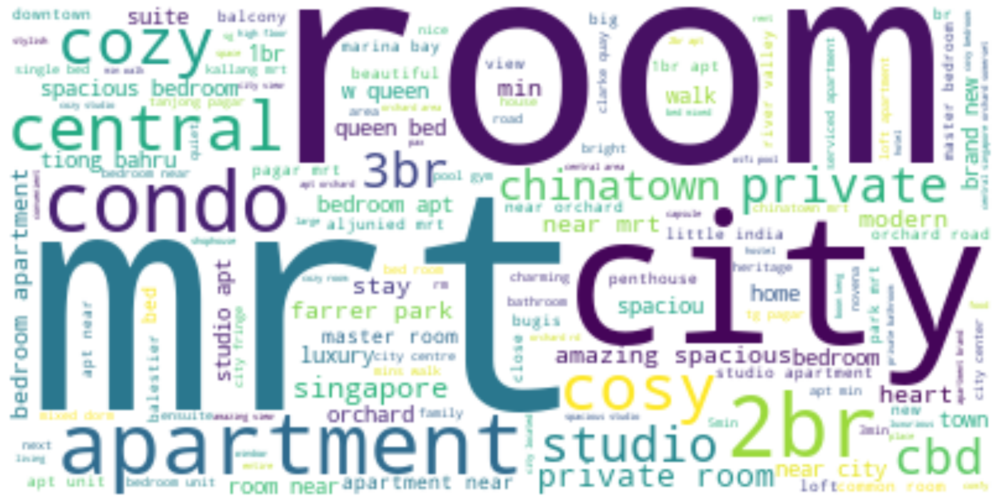

In [90]:
from wordcloud import WordCloud, ImageColorGenerator
text = ' '.join(str(n).lower() for n in airbnb_dataset.name)

wordcloud = WordCloud(max_words=200, background_color = 'white').generate(text)
plt.figure(figsize=(25,20))
plt.imshow(wordcloud, interpolation='bilinear')
plt.axis('off')
plt.show()

__Observations:__
- The most repeated words in the name column is 'mrt', 'room', 'city'.
- I would be exploring more about 'mrt' later on.

C:\Pranav\Anaconda\lib\site-packages\seaborn\axisgrid.py:156: UserWarning:

The handle <matplotlib.patches.Patch object at 0x0000026745D2FD30> has a label of '_nolegend_' which cannot be automatically added to the legend.



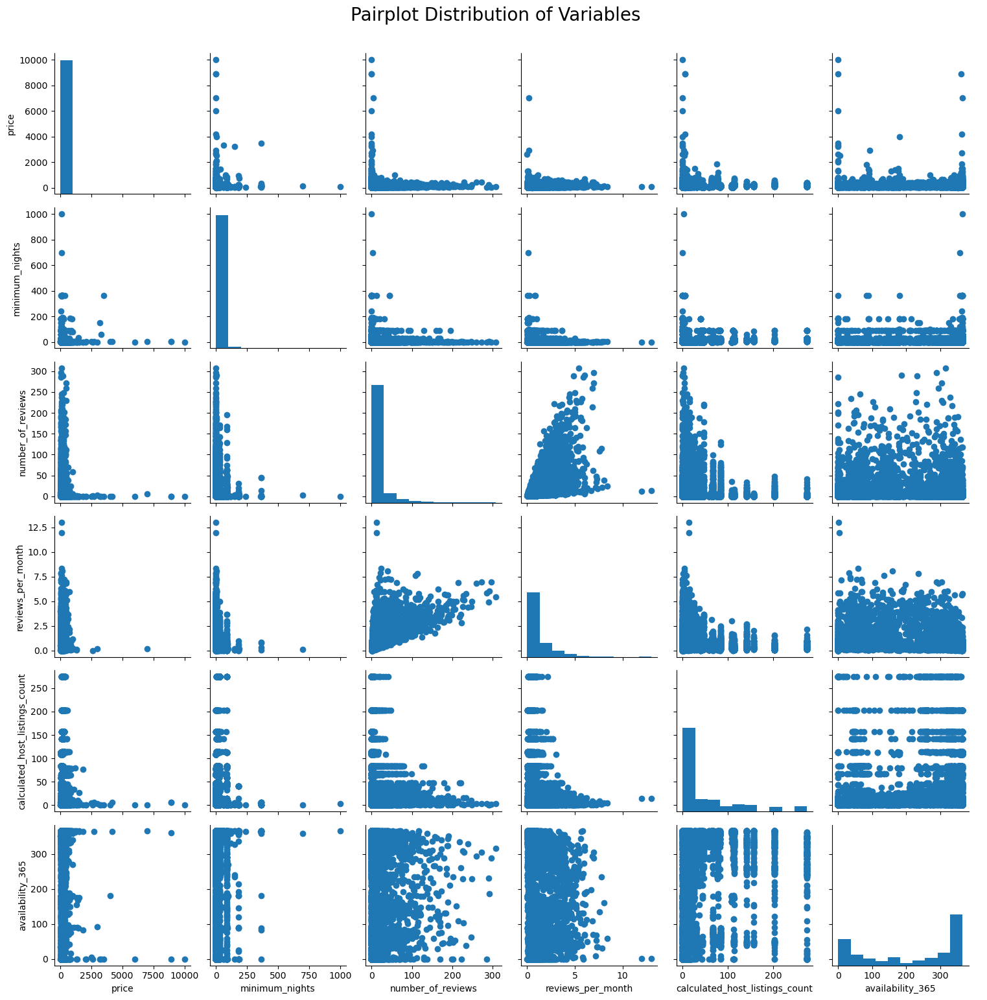

In [91]:
pairgrid = sns.PairGrid(data=airbnb_dataset, vars=['price', 'minimum_nights', 'number_of_reviews',
                                                   'reviews_per_month', 'calculated_host_listings_count',
                                                   'availability_365'])

pairgrid.map_diag(plt.hist)
pairgrid.map_offdiag(plt.scatter)

pairgrid.add_legend()

pairgrid.fig.suptitle('Pairplot Distribution of Variables', y=1.03, fontsize=20)
plt.show()

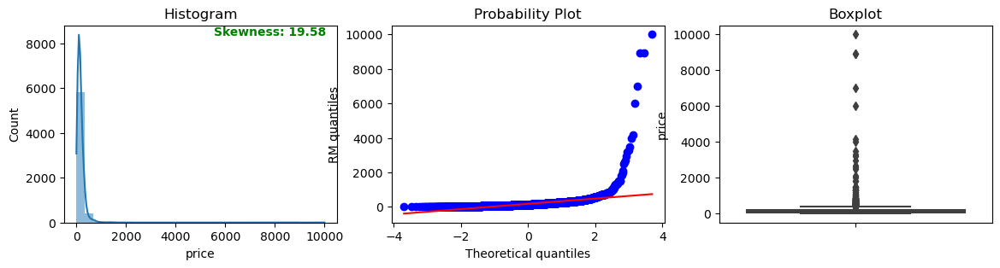

In [92]:
plot_charts_numerical(airbnb_dataset, 'price')

__Observation:__
* price is very heavily right skewed
* Many outliers are present

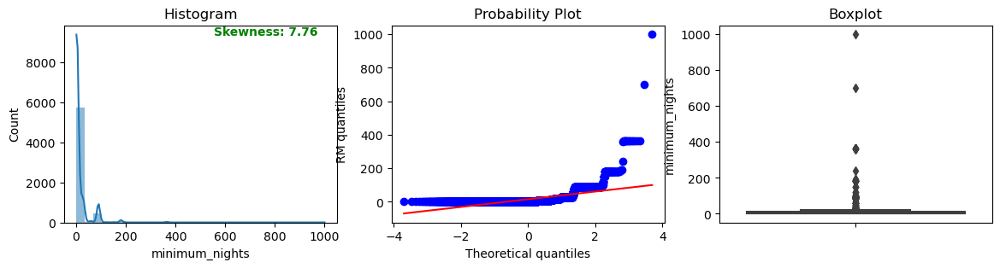

In [93]:
plot_charts_numerical(airbnb_dataset, 'minimum_nights')

__Observation:__
* minimum_nights is right skewed
* Many outliers are present

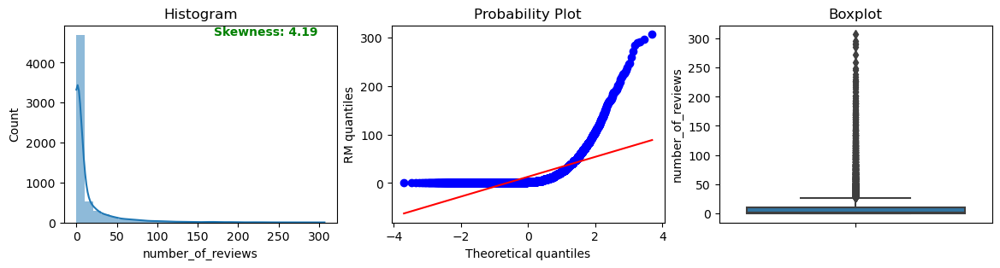

In [94]:
plot_charts_numerical(airbnb_dataset, 'number_of_reviews')

__Observation:__
* number_of_reviews is right skewed
* Many outliers are present

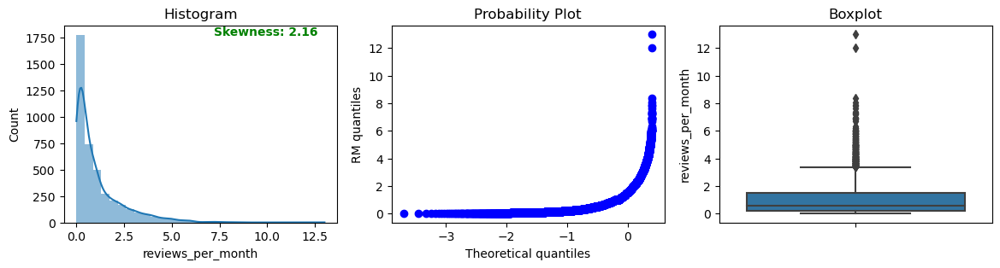

In [95]:
plot_charts_numerical(airbnb_dataset, 'reviews_per_month')

__Observation:__
* reviews_per_month is right skewed
* Some outliers are present

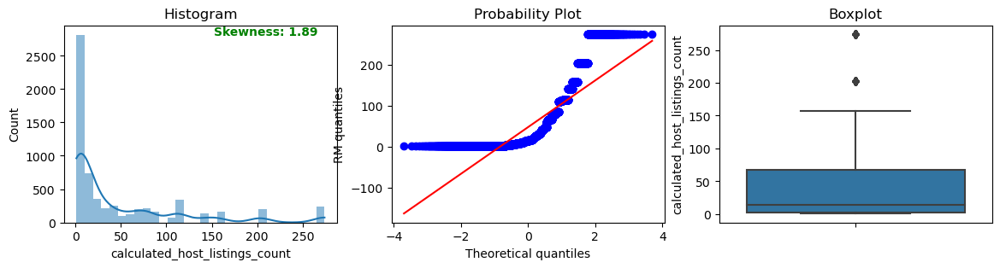

In [96]:
plot_charts_numerical(airbnb_dataset, 'calculated_host_listings_count')

__Observation:__
* calculated_host_listings_count is right skewed
* Few outliers are present

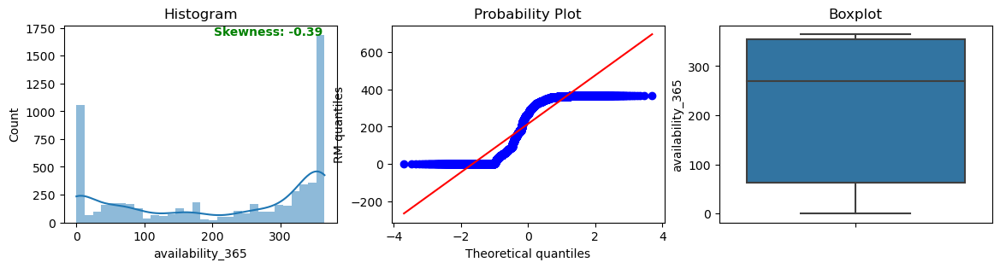

In [97]:
plot_charts_numerical(airbnb_dataset, 'availability_365')

__Observation:__
* availability_365 is right skewed
* No outliers are present

<a id= "part2.4"></a>
### 1.4 Feature Creation
[Go to Start](#Start)

In [98]:
mrt_lrt_address = pd.read_csv('mrt_lrt_data.csv')

def compute_distance(address_row, mrt_lrt_address):
    airbnb_lat, airbnb_lng = address_row[['latitude','longitude']]
    min_distance = 9999.0
    nearest_stn = ''
    nearest_lat = 0
    nearest_lng = 0
    
    for stn_lat,stn_lng,stn_name in zip(mrt_lrt_address['latitude'], mrt_lrt_address['longitude'], mrt_lrt_address['stn_name']):
        distance = geodesic((airbnb_lat,airbnb_lng),(stn_lat,stn_lng)).km
        
        if distance < min_distance:
            min_distance = distance
            nearest_stn = stn_name
            nearest_lat = stn_lat
            nearest_lng = stn_lng
            
    return min_distance, nearest_stn, nearest_lat, nearest_lng

In [99]:
distance_list = []
nearest_stn_list = []
nearest_stn_lat_list = []
nearest_stn_lng_list = []

for i in range(0, 6309):
    values = compute_distance(airbnb_dataset.loc[i], mrt_lrt_address)
    distance_list.append(round(values[0]*1000))
    nearest_stn_list.append(values[1])
    nearest_stn_lat_list.append(values[2])
    nearest_stn_lng_list.append(values[3])

In [100]:
airbnb_dataset['nearest_stn'] = nearest_stn_list
airbnb_dataset['nearest_stn_lat'] = nearest_stn_lat_list
airbnb_dataset['nearest_stn_lng'] = nearest_stn_lng_list
airbnb_dataset['distance_from_stn(m)'] = distance_list
airbnb_dataset

,index,id,name,host_id,host_name,neighbourhood,latitude,longitude,room_type,price,minimum_nights,number_of_reviews,last_review,reviews_per_month,calculated_host_listings_count,availability_365,nearest_stn,nearest_stn_lat,nearest_stn_lng,distance_from_stn(m)
0,1,50646,Pleasant Room along Bukit Timah,227796,Sujatha,Bukit Timah,1.33235,103.78521,Private room,81,90,18,2014-12-26,0.28,1,365,KING ALBERT PARK MRT STATION,1.335663,103.783399,418
1,10,275343,Conveniently located City Room!( (Phone number...,1439258,K2 Guesthouse,Bukit Merah,1.28875,103.80814,Private room,44,15,18,2019-04-21,0.23,32,331,QUEENSTOWN MRT STATION,1.294551,103.806077,681
2,11,275344,15 mins to Outram MRT Single Room (B),1439258,K2 Guesthouse,Bukit Merah,1.28837,103.81099,Private room,40,30,10,2018-09-13,0.11,32,276,REDHILL MRT STATION,1.289635,103.816741,655
3,13,294281,5 mins walk from Newton subway,1521514,Elizabeth,Newton,1.31125,103.83816,Private room,65,2,125,2019-08-22,1.35,6,336,NEWTON MRT STATION,1.312320,103.837985,120
4,14,324945,20 Mins to Sentosa @ Hilltop ! (8),1439258,K2 Guesthouse,Bukit Merah,1.28976,103.80896,Private room,44,30,13,2019-02-02,0.15,32,340,QUEENSTOWN MRT STATION,1.294551,103.806077,619
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6304,7902,38105126,Loft 2 pax near Haw Par / Pasir Panjang. Free ...,278109833,Belle,Queenstown,1.27973,103.78751,Entire home/apt,100,3,0,NaN,NaN,31,61,PASIR PANJANG MRT STATION,1.276214,103.791350,578
6305,7903,38108273,3bedroom luxury at Orchard,238891646,Neha,Tanglin,1.29269,103.82623,Entire home/apt,550,6,0,NaN,NaN,34,365,TIONG BAHRU MRT STATION,1.286195,103.826999,723
6306,7904,38109336,[ Farrer Park ] New City Fringe CBD Mins to MRT,281448565,Mindy,Kallang,1.31286,103.85996,Private room,58,30,0,NaN,NaN,3,173,BENDEMEER MRT STATION,1.313672,103.862978,348
6307,7905,38110493,Cheap Master Room in Central of Singapore,243835202,Huang,River Valley,1.29543,103.83801,Private room,56,14,0,NaN,NaN,2,30,GREAT WORLD MRT STATION,1.293815,103.833725,509


- The mass rapid transit (MRT) and light rapid transit (LRT) form Singapore’s public train system.
- Whenever possible, property developers, would if they could advertise their properties as being in walking distance from a train station. With this, it can be reasonable to extrapolate that listings near train stations can command a higher than average price.
- I found the nearest MRT/LRT station for each property and as well calculated the distance between each listing and the MRT/LRT.


In [101]:
fig = px.scatter_mapbox(airbnb_dataset, lat="latitude", lon="longitude", hover_name="name", hover_data=["host_name", "room_type", "minimum_nights", "nearest_stn", "distance_from_stn(m)"], zoom=10.5, height=600,width=1200,color="price",
                   size_max=15, range_color=[0,400])

fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})

fig.add_trace(
    px.scatter_mapbox(airbnb_dataset, lat="nearest_stn_lat", lon="nearest_stn_lng", hover_name="nearest_stn").data[0]
        .update(marker=dict(size=10, color="black"), name='Train Station'))

fig.update_layout(showlegend=True)
fig.show()

In [102]:
roomtype_list = airbnb_dataset['room_type'].unique().tolist()

fig = go.Figure()

initial_roomtype = roomtype_list[0]
initial_data = airbnb_dataset[airbnb_dataset['room_type'] == initial_roomtype]
fig.add_trace(go.Scatter(
    x=initial_data['distance_from_stn(m)'],
    y=initial_data['price'],
    mode='markers',
    marker=dict(size=8, opacity=0.6),
    name=initial_roomtype
))

def update_roomtype(roomtype):
    filtered_data = airbnb_dataset[airbnb_dataset['room_type'] == roomtype]
    fig.data[0].x = filtered_data['distance_from_stn(m)']
    fig.data[0].y = filtered_data['price']
    fig.data[0].name = roomtype
    fig.update_layout(title=f"Distance from Train Station vs Price - Room Type: {roomtype}")

dropdown = go.layout.Updatemenu(
    buttons=list([
        dict(method='update',
             label=roomtype,
             args=[{'x': [airbnb_dataset[airbnb_dataset['room_type'] == roomtype]['distance_from_stn(m)']],
                    'y': [airbnb_dataset[airbnb_dataset['room_type'] == roomtype]['price']],
                    'marker.size': 8,
                    'marker.opacity': 0.6,
                    'name': roomtype},
                   {'title': f"Distance from Train Station vs Price - Room Type: {roomtype}",
                    'xaxis': {'title': 'Distance from Train Station (m)'},
                    'yaxis': {'title': 'Price'}}])
        for roomtype in roomtype_list
    ]),
)

fig.update_layout(
    updatemenus=[dropdown],
    xaxis_title='Distance from Train Station (m)',
    yaxis_title='Price',
    showlegend=True
)

fig.show()

In [103]:
average_prices = airbnb_dataset.groupby('nearest_stn')['price'].mean().reset_index().sort_values('price', ascending=False).head(30)

bar_fig = px.bar(average_prices, x='nearest_stn', y='price', labels={'price': 'Average Price', 'nearest_stn': 'Train Station'}, title='Top 30 Average Price for Train Station')

bar_fig.update_traces(texttemplate='%{text:.2s}', textposition='outside')
bar_fig.update_layout(xaxis_title='Train Station', yaxis_title='Average Price', showlegend=False, height=700, width=900)

bar_fig.show()

__Observations:__
- If a Airbnb listing is close to Harbourfront, then that listing price would be very expensive. This can be because the closest station for Sentosa is Harbourfront and therefore the average price of listings near Harbourfront MRT station is expensive.
- 2nd is City Hall and this can be due to the fact that there are many tourist spots at City Hall and it is a very touristy spot therefore listings near this MRT station is expensive.

<a id= "part2.5"></a>
### 1.5 Missing Value Imputation
[Go to Start](#Start)

In [104]:
airbnb_dataset.isnull().sum().sort_values(ascending=False)

reviews_per_month                 2165
last_review                       2165
name                                 2
index                                0
number_of_reviews                    0
nearest_stn_lng                      0
nearest_stn_lat                      0
nearest_stn                          0
availability_365                     0
calculated_host_listings_count       0
minimum_nights                       0
id                                   0
price                                0
room_type                            0
longitude                            0
latitude                             0
neighbourhood                        0
host_name                            0
host_id                              0
distance_from_stn(m)                 0
dtype: int64

In [105]:
airbnb_dataset['reviews_per_month'].fillna(0, inplace=True)

In [106]:
airbnb_dataset.drop(columns=['name','last_review'], inplace=True)

In [107]:
airbnb_dataset.isnull().sum().sort_values(ascending=False)

index                             0
id                                0
nearest_stn_lng                   0
nearest_stn_lat                   0
nearest_stn                       0
availability_365                  0
calculated_host_listings_count    0
reviews_per_month                 0
number_of_reviews                 0
minimum_nights                    0
price                             0
room_type                         0
longitude                         0
latitude                          0
neighbourhood                     0
host_name                         0
host_id                           0
distance_from_stn(m)              0
dtype: int64

This is how I carried out __Missing Value Imputation__:<br><br>
__name__
> name will not be able to provide any significant value to the model as it is a categorical column that has long sentences and it will not be easy to convert this column to a numerical column as since the model only understands numbers.
    
__last_review__
> last_review is a date and it is not possible to give a date datatype to the model. Additonally, this feature does not seem helpful to predict prices.

__reviews_per_month__
> This column has null values as listings have never been reviewed and therefore I replaced the null values with 0 to indicate that the listing has never recieved reviews before.

<a id= "part2.6"></a>
### 1.6 Handling Outliers
[Go to Start](#Start)

In [108]:
winsorizer = Winsorizer(capping_method ='iqr', 
                         tail='both',
                         fold = 0.1,
                         variables=['minimum_nights', 'number_of_reviews', 'reviews_per_month', 'calculated_host_listings_count'])

winsorizer.fit(airbnb_dataset)
airbnb_dataset = winsorizer.transform(airbnb_dataset)

__Why is winsorising outliers necessary:__
- The biggest issue with this dataset is the outliers and they make the dataset very noisy.
- Removing outliers is an option but that will lead to a huge data loss.
- Winsorizing retains the information from outliers while reducing their impact on statistical measures or models. It adjusts extreme values to more plausible values within a certain range.

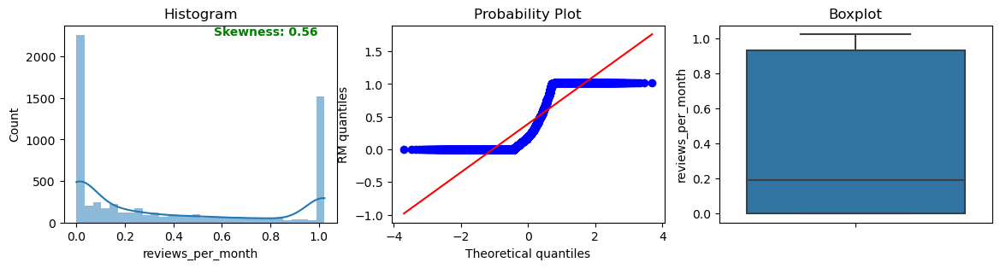

In [109]:
plot_charts_numerical(airbnb_dataset, 'reviews_per_month')

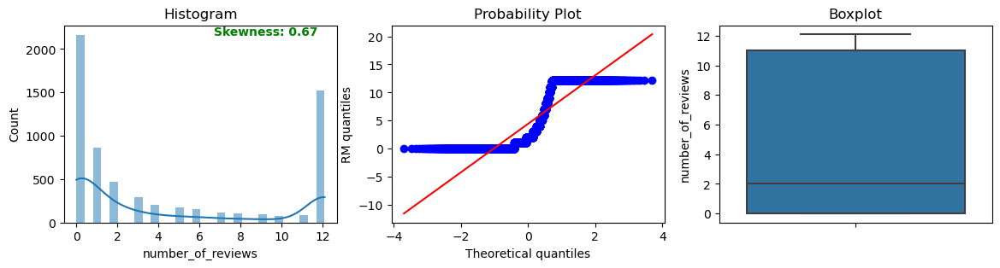

In [110]:
plot_charts_numerical(airbnb_dataset, 'number_of_reviews')

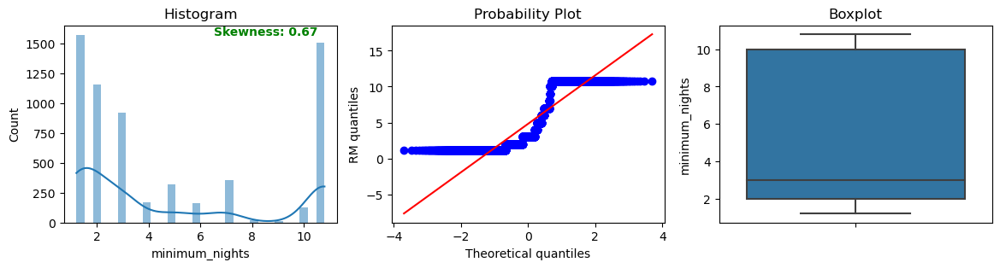

In [111]:
plot_charts_numerical(airbnb_dataset, 'minimum_nights')

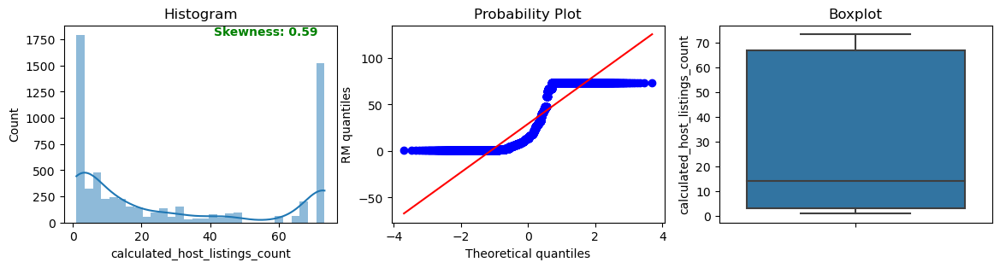

In [112]:
plot_charts_numerical(airbnb_dataset, 'calculated_host_listings_count')

By using Winsorisation, the feature's extreme values which are beyond a certain point are replaced or set to a specified threshold value and this technique was effective in fixing the outliers. Another positive is that the skewness of the features has also reduced.

<a id= "part2.7"></a>
### 1.7 Numerical Transformations
[Go to Start](#Start)

In [113]:
def transformation_processor(feature, method, exp=None):

    if method == "log": transformer= LogTransformer(variables= feature)
    elif method == "rec": transformer= ReciprocalTransformer(variables= feature)
    elif method == "power": transformer= PowerTransformer(variables= feature, exp= exp)
    elif method == "box": transformer= BoxCoxTransformer(variables= feature)
    elif method == "yeo": transformer= YeoJohnsonTransformer(variables= feature)

    transformer.fit(airbnb_dataset)
    trans_testing_set= transformer.transform(airbnb_dataset)

    return trans_testing_set

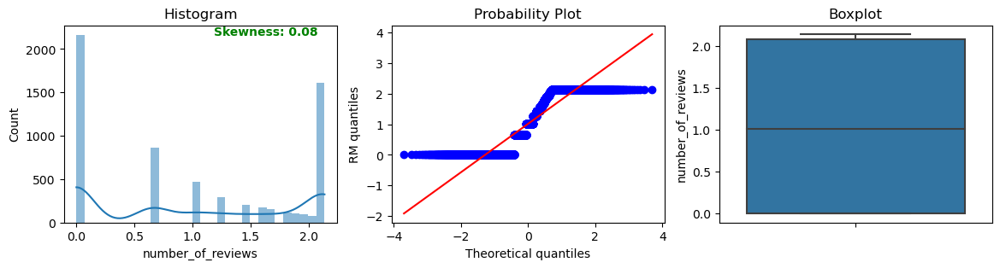

In [114]:
trans_testing_set= transformation_processor('number_of_reviews', 'yeo')
plot_charts_numerical(trans_testing_set, 'number_of_reviews')

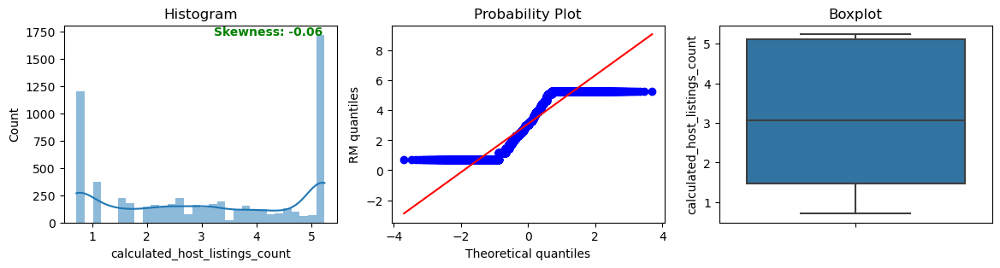

In [115]:
trans_testing_set= transformation_processor('calculated_host_listings_count', 'yeo')
plot_charts_numerical(trans_testing_set, 'calculated_host_listings_count')

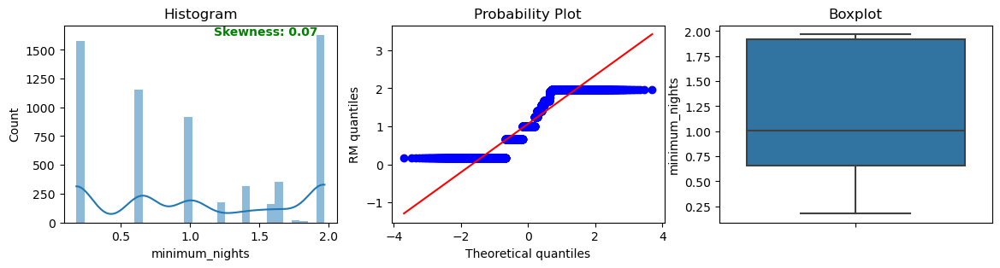

In [116]:
trans_testing_set= transformation_processor('minimum_nights', 'box')
plot_charts_numerical(trans_testing_set, 'minimum_nights')

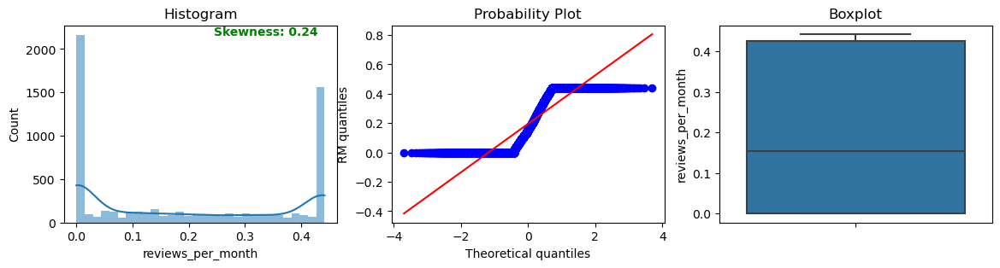

In [117]:
trans_testing_set= transformation_processor('reviews_per_month', 'yeo')
plot_charts_numerical(trans_testing_set, 'reviews_per_month')

In [118]:
numerical_transformation_pipe= Pipeline(steps=[
    ('boxcox_trans', BoxCoxTransformer(variables= ['minimum_nights'])),
    ('yeo_trans', YeoJohnsonTransformer(variables= ['reviews_per_month','calculated_host_listings_count','number_of_reviews'])),
])

numerical_transformation_pipe.fit(airbnb_dataset)
airbnb_dataset = numerical_transformation_pipe.transform(airbnb_dataset)

| Column                         | Transformation   |
|--------------------------------|------------------|
| minimum_nights                 | Box-Cox          |
| reviews_per_month              | Yeo-Johnson      |
| calculated_host_listings_count | Yeo-Johnson      |
| number_of_reviews              | Yeo-Johnson      |


These transformations has reduced the skewness of the features further which is very beneficial.

<a id= "part2.8"></a>
### 1.8 Categorical Data Encoding
[Go to Start](#Start)

In [119]:
encoding_transformation_pipe= Pipeline(steps=[
    ('ordinal_enc', OrdinalEncoder(variables= ['neighbourhood','nearest_stn', 'room_type'], encoding_method= "ordered"))
])

target_column = airbnb_dataset['price']
encoding_transformation_pipe.fit(airbnb_dataset.drop(labels=['price'], axis=1), airbnb_dataset['price'])

Pipeline(steps=[('ordinal_enc',
                 OrdinalEncoder(variables=['neighbourhood', 'nearest_stn',
                                           'room_type']))])

__Encoding methods chosen:__<br><br>

__neighbourhood:__<br>
Ordered Ordinal Encoding
> There seem to be a natural order to the neighbourhood. Due to this nature forming a ordinal relationship, I decided to use ordinal encoding for this feature. Moreover, doing one hot encoding could lead to problems as it will result in curse of dimensionality as this column has a high cardinality.

__nearest_stn:__<br>
Ordered Ordinal Encoding
> Similar to the feature above, I decided to use ordinal encoding for this feature as this has high cardinality and by doing dummy encoding, it will lead to curse of dimensionality.

__room_type:__<br>
Ordered Ordinal Encoding
> There seem to be a natural order to the room type. The order will be Shared room, Private room then Entire home/apt. I have customised the pipeline for this feature to follow this custom order.

In [120]:
encoding_transformation_pipe[0].encoder_dict_['room_type']= {'Shared room': 0, 'Private room': 1, 'Entire home/apt': 2}

In [121]:
airbnb_dataset = encoding_transformation_pipe.transform(airbnb_dataset.drop(labels=['price'], axis=1))

In [122]:
airbnb_dataset = pd.concat([airbnb_dataset, target_column], axis=1)

In [123]:
airbnb_dataset

,index,id,host_id,host_name,neighbourhood,latitude,longitude,room_type,minimum_nights,number_of_reviews,reviews_per_month,calculated_host_listings_count,availability_365,nearest_stn,nearest_stn_lat,nearest_stn_lng,distance_from_stn(m),price
0,1,50646,227796,Sujatha,5,1.33235,103.78521,1,1.969434,2.138255,0.207605,0.714674,365,76,1.335663,103.783399,418,81
1,10,275343,1439258,K2 Guesthouse,3,1.28875,103.80814,1,1.969434,2.138255,0.178902,4.092619,331,42,1.294551,103.806077,681,44
2,11,275344,1439258,K2 Guesthouse,3,1.28837,103.81099,1,1.969434,2.017453,0.096867,4.092619,276,47,1.289635,103.816741,655,40
3,13,294281,1521514,Elizabeth,11,1.31125,103.83816,1,0.655126,2.138255,0.441886,2.122026,336,58,1.312320,103.837985,120,65
4,14,324945,1439258,K2 Guesthouse,3,1.28976,103.80896,1,1.969434,2.138255,0.126544,4.092619,340,42,1.294551,103.806077,619,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6304,7902,38105126,278109833,Belle,0,1.27973,103.78751,2,1.005146,-0.000000,-0.000000,4.050847,61,21,1.276214,103.791350,578,100
6305,7903,38108273,238891646,Neha,14,1.29269,103.82623,2,1.552054,-0.000000,-0.000000,4.172810,365,34,1.286195,103.826999,723,550
6306,7904,38109336,281448565,Mindy,8,1.31286,103.85996,1,1.969434,-0.000000,-0.000000,1.474192,173,29,1.313672,103.862978,348,58
6307,7905,38110493,243835202,Huang,7,1.29543,103.83801,1,1.969434,-0.000000,-0.000000,1.153343,30,46,1.293815,103.833725,509,56


<a id= "part2.9"></a>
### 1.9 Correlation Analysis
[Go to Start](#Start)

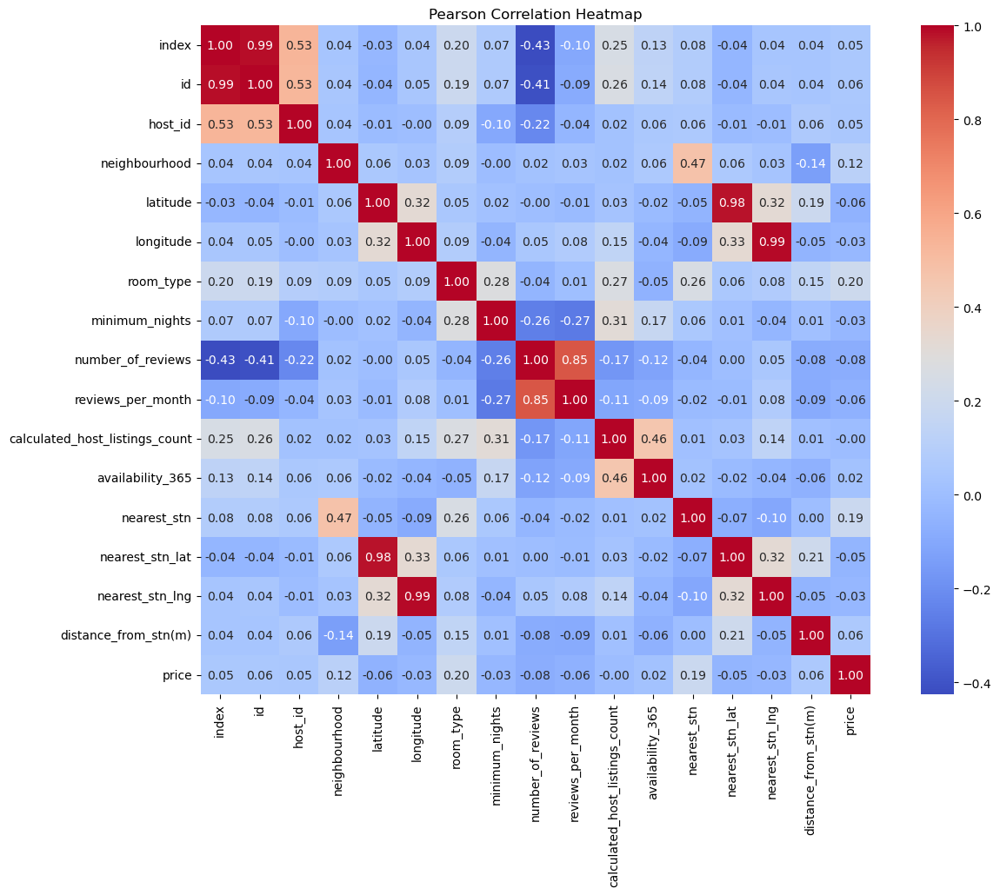

In [124]:
correlation_matrix = airbnb_dataset.corr()

plt.figure(figsize=(15,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title('Pearson Correlation Heatmap')
plt.show()

__Observation:__
- Some significant correlation between the features and the target variable:
> - neighbourhood <br>
> - room_type<br>
> - nearest_stn <br>

<a id= "part2.10"></a>
### 1.10 Feature Selection
[Go to Start](#Start)

In [125]:
airbnb_dataset.drop(columns=['id','host_name','latitude','longitude', 'index', 'nearest_stn_lat', 'nearest_stn_lng'], inplace=True)

In [126]:
lm2 = sm.OLS(airbnb_dataset['price'], airbnb_dataset.drop('price', axis=1)).fit()
lm2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 OLS Regression Results                                
=======================================================================================
Dep. Variable:                  price   R-squared (uncentered):                   0.328
Model:                            OLS   Adj. R-squared (uncentered):              0.327
Method:                 Least Squares   F-statistic:                              307.2
Date:                Sun, 10 Dec 2023   Prob (F-statistic):                        0.00
Time:                        18:32:33   Log-Likelihood:                         -44529.
No. Observations:                6309   AIC:                                  8.908e+04
Df Residuals:                    6299   BIC:                                  8.914e+04
Df Model:                          10                                                  
Covariance Type:            nonrobust                                                  
==================================================================================================
                                     coef    std err          t      P>|t|      [0.025      0.975]
--------------------------------------------------------------------------------------------------
host_id                        -4.518e-08   4.46e-08     -1.013      0.311   -1.33e-07    4.23e-08
neighbourhood                      3.2991      0.906      3.641      0.000       1.523       5.075
room_type                        104.9066      6.635     15.811      0.000      91.900     117.913
minimum_nights                   -51.2658      5.676     -9.033      0.000     -62.392     -40.140
number_of_reviews                -24.5410      7.981     -3.075      0.002     -40.186      -8.896
reviews_per_month                -56.5149     38.480     -1.469      0.142    -131.949      18.920
calculated_host_listings_count   -13.0310      2.481     -5.253      0.000     -17.894      -8.168
availability_365                   0.1444      0.028      5.148      0.000       0.089       0.199
nearest_stn                        1.7670      0.216      8.177      0.000       1.343       2.191
distance_from_stn(m)               0.0359      0.013      2.736      0.006       0.010       0.062
==============================================================================
Omnibus:                    14175.913   Durbin-Watson:                   1.945
Prob(Omnibus):                  0.000   Jarque-Bera (JB):         92651391.902
Skew:                          21.070   Prob(JB):                         0.00
Kurtosis:                     595.181   Cond. No.                     1.38e+09
==============================================================================

Notes:
[1] R² is computed without centering (uncentered) since the model does not contain a constant.
[2] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[3] The condition number is large, 1.38e+09. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

__Observation:__
- From the above model summary, we can see that `host_id` and `reviews_per_month` have a higher p-value compared to other features. It means these features has lower confidence on the coefficients of these features and these features may not be good indicators to predict `price`
- The other features have p-value close to 0

In [127]:
X = airbnb_dataset.drop(columns=['price'], axis=1)
y = airbnb_dataset['price']

In [128]:
fs = SelectKBest(score_func=f_regression, k=10)
fit = fs.fit(X, y)

features_score = pd.DataFrame(fit.scores_)
features_pvalue = pd.DataFrame(np.round(fit.pvalues_,6))
features = pd.DataFrame(X.columns)
feature_score = pd.concat([features, features_score, features_pvalue], axis=1)
feature_score.columns = ['Input Feature', 'F_Score', 'P_Value']

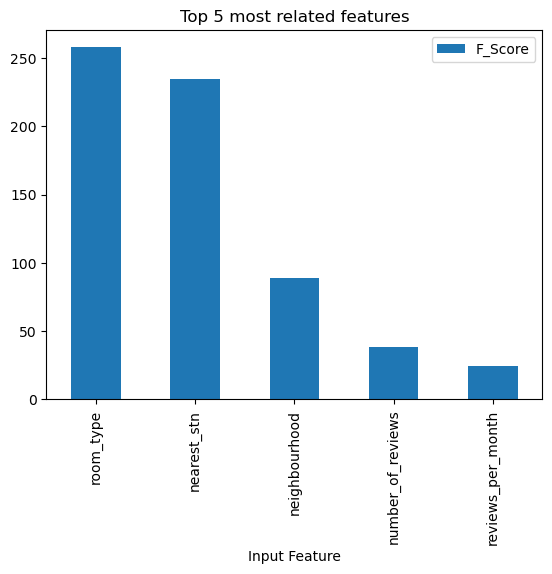

In [129]:
most_related_features_by_score = feature_score.nlargest(5,'F_Score')
most_related_features_by_score.plot.bar(x='Input Feature', y='F_Score', rot=90)
plt.title('Top 5 most related features')
plt.show()

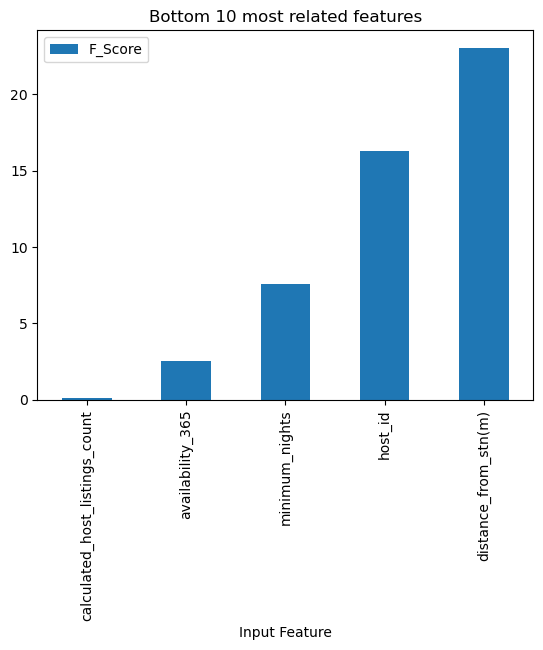

In [130]:
least_related_features_by_score = feature_score.nsmallest(5, 'F_Score')
least_related_features_by_score.plot.bar(x='Input Feature', y='F_Score', rot=90)
plt.title('Bottom 5 most related features')
plt.show()

In [131]:
airbnb_dataset.drop(columns=['host_id', 'reviews_per_month', 'distance_from_stn(m)', 'calculated_host_listings_count'], inplace=True)

I removed these 3 columns as these columns will not help the target variable based on the tests I did above.

<a id= "part2.11"></a>
### 1.11 Feature Scaling
[Go to Start](#Start)

In [132]:
target_column = airbnb_dataset['price']

scaler = StandardScaler()
scaler.fit(airbnb_dataset.drop(labels=['price'], axis=1))
airbnb_dataset_scaled = scaler.transform(airbnb_dataset.drop(labels=['price'], axis=1))

airbnb_dataset_scaled = pd.DataFrame(airbnb_dataset_scaled, columns=(airbnb_dataset.drop(labels=['price'], axis=1)).columns)
airbnb_dataset_scaled = pd.concat([airbnb_dataset_scaled, target_column], axis=1)

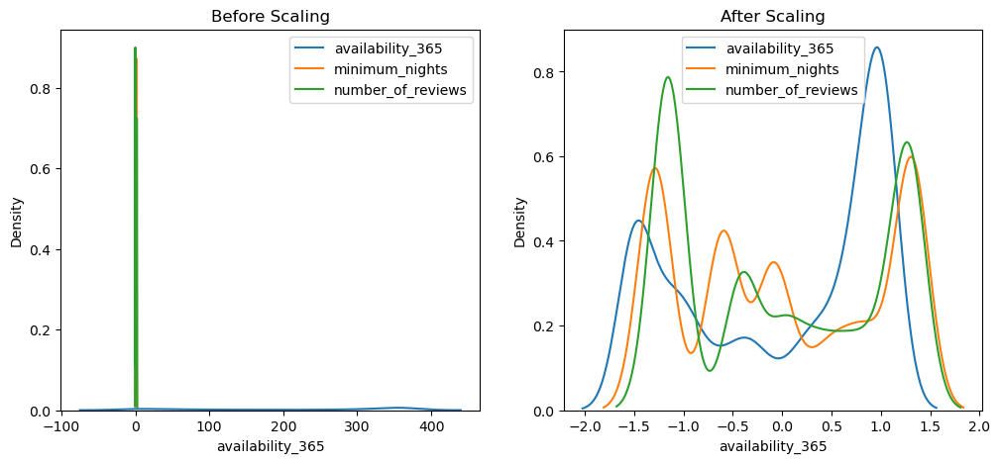

In [133]:
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12, 5))

# before scaling
ax1.set_title('Before Scaling')
sns.kdeplot(airbnb_dataset['availability_365'], ax=ax1, label ='availability_365')
sns.kdeplot(airbnb_dataset['minimum_nights'], ax=ax1, label ='minimum_nights')
sns.kdeplot(airbnb_dataset['number_of_reviews'], ax=ax1, label ='number_of_reviews')
ax1.legend()

# after scaling
ax2.set_title('After Scaling')
sns.kdeplot(airbnb_dataset_scaled['availability_365'], ax=ax2, label ='availability_365')
sns.kdeplot(airbnb_dataset_scaled['minimum_nights'], ax=ax2, label ='minimum_nights')
sns.kdeplot(airbnb_dataset_scaled['number_of_reviews'], ax=ax2, label ='number_of_reviews')
ax2.legend()
plt.show()

airbnb_dataset = airbnb_dataset_scaled

__Reason to do Scaling:__
>Linear Regression heavily depend on distances between data points, and features with larger scales can disproportionately impact distance computations which adds bias.

>Scaling features to a similar range can improve the stability of calculations within the algorithms, especially when features have very different scales. This can improve the stability of the model.

<a id= "part2.12"></a>
### 1.12 Polynomial Expansion
[Go to Start](#Start)

Polynomial Expansion is a feature engineering technique that is used to create new features by raising the existing features to various powers. It is usually used to improve models and it does it in several ways:
- Polynomial expansion allows the model to capture and learn more complex, non-linear relationships between the features. This enables the model to better represent and fit non-linear patterns in the data.
- Polynomial expansion increases the flexibility of the model by introducing a wider range of functional forms. It allows the model to fit the data more closely and make more accurate predictions.

In [134]:
poly = PolynomialFeatures(degree=2, interaction_only=False, include_bias=False)

poly.fit(airbnb_dataset.drop(labels=['price'], axis=1))
airbnb_dataset = poly.transform(airbnb_dataset.drop(labels=['price'], axis=1))
airbnb_dataset = pd.DataFrame(airbnb_dataset)

airbnb_dataset = pd.concat([airbnb_dataset, target_column], axis=1)

In [135]:
correlation_matrix = airbnb_dataset.corr()
threshold = 0.02

low_corr_columns = correlation_matrix[abs(correlation_matrix['price']) < threshold].index

airbnb_dataset = airbnb_dataset.drop(low_corr_columns, axis=1)

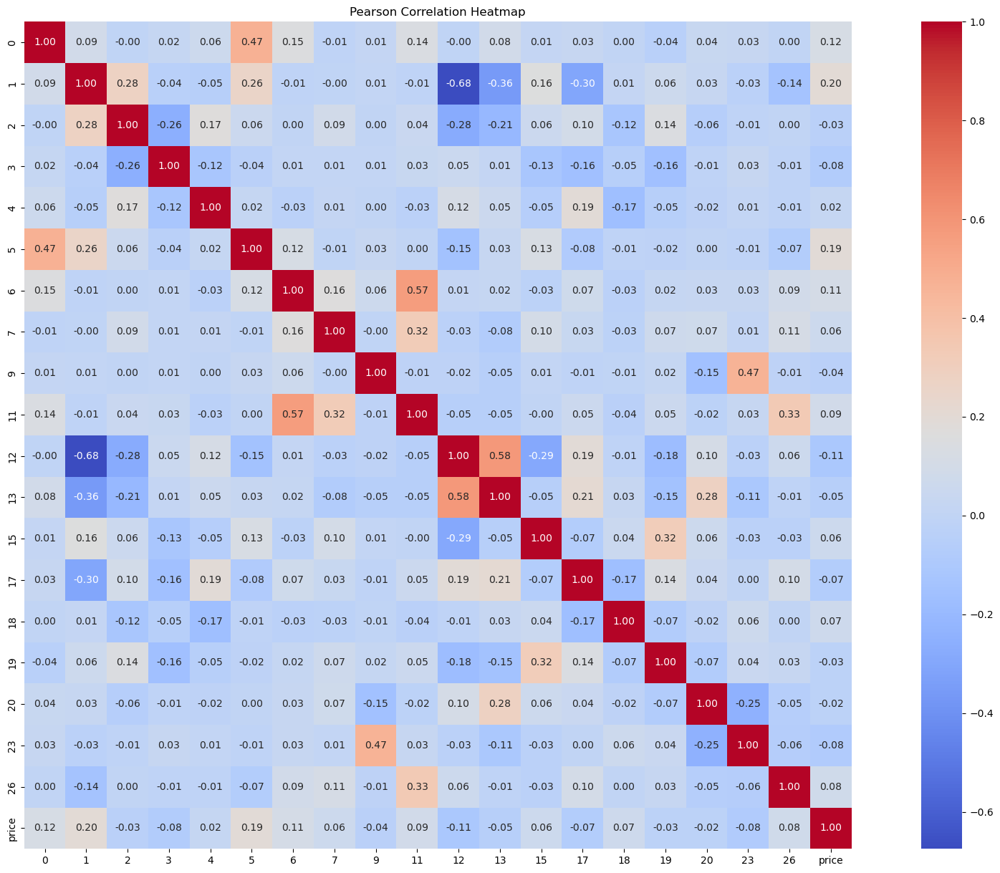

In [138]:
correlation_matrix = airbnb_dataset.corr()

plt.figure(figsize=(25,15))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', square=True)
plt.title('Pearson Correlation Heatmap')
plt.show()

Polynomial Expansion can also create features that can be more correlated to the target column which can also make the accuracy of the model go up.

In [136]:
airbnb_dataset

,0,1,2,3,4,5,6,7,9,11,12,13,15,17,18,19,20,23,26,price
0,-0.644216,-0.896886,1.316571,1.287215,1.041662,1.717427,0.415014,0.577788,-0.829244,-1.106393,0.804404,-1.180814,-0.934252,1.733359,1.694710,1.371422,2.261115,2.210698,2.949556,81
1,-1.096414,-0.896886,1.316571,1.287215,0.804864,-0.106671,1.202123,0.983358,-1.411320,0.116955,0.804404,-1.180814,-0.721871,1.733359,1.694710,1.059661,-0.140439,-0.137308,0.011379,44
2,-1.096414,-0.896886,1.316571,1.149116,0.421809,0.161579,1.202123,0.983358,-1.259906,-0.177157,0.804404,-1.180814,-0.378314,1.733359,1.512893,0.555341,0.212730,0.185673,0.026108,40
3,0.712379,-0.896886,-0.596369,1.287215,0.839687,0.751728,0.507483,-0.638922,0.916984,0.535515,0.804404,0.534875,-0.753104,0.355656,-0.767655,-0.500763,-0.448307,0.967636,0.565096,65
4,-1.096414,-0.896886,1.316571,1.287215,0.867546,-0.106671,1.202123,0.983358,-1.411320,0.116955,0.804404,-1.180814,-0.778090,1.733359,1.694710,1.142186,-0.140439,-0.137308,0.011379,44
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6304,-1.774711,0.772274,-0.086924,-1.157189,-1.075590,-1.233319,3.149598,-1.370563,2.053676,2.188785,0.596408,-0.067129,-0.830650,0.007556,0.100588,0.093495,0.107205,1.427184,1.521076,100
6305,1.390676,0.772274,0.709086,-1.157189,1.041662,-0.535870,1.933979,1.073983,-1.609275,-0.745221,0.596408,0.547609,0.804449,0.502803,-0.820547,0.738628,-0.379978,0.620103,0.287157,550
6306,0.034081,-0.896886,1.316571,-1.157189,-0.295550,-0.804120,0.001162,-0.030567,-0.039439,-0.027406,0.804404,-1.180814,0.265074,1.733359,-1.523522,-0.389112,-1.058681,0.930519,0.646609,58
6307,-0.192018,-0.896886,1.316571,-1.157189,-1.291494,0.107929,0.036871,0.172218,0.222201,-0.020724,0.804404,-1.180814,1.158323,1.733359,-1.523522,-1.700343,0.142096,-0.124894,0.011649,56
